In [1]:
#DSC650
#Christine Orosco

## Create create a ConvNet model that classifies images in the MNIST

In [ ]:
# 6.1  Create create a ConvNet model that classifies images in the MNIST
#  digit dataset. 
#  Save the model, predictions, metrics, and validation plots in 
# the dsc650/assignments/assignment06/results directory

In [2]:
from keras import layers
from keras import models

### Build the model

In [3]:
#  Create Convnet

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

In [4]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          36928     
Total params: 55,744
Trainable params: 55,744
Non-trainable params: 0
_________________________________________________________________


In [5]:

# Add a classifier

model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

In [6]:
# Display model results

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 576)               0         
_________________________________________________________________
dense (Dense)                (None, 64)                3

### Train the model

In [7]:
# Train the model on the MNIST image dataset 

from keras.datasets import mnist 
from tensorflow.keras.utils import to_categorical

In [8]:
# assign dataset to variables
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

# Reformat the data subsets

train_images = train_images.reshape((60000, 28, 28, 1))
train_images = train_images.astype('float32')/255

test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype('float32')/255

train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

In [9]:
# Build amd fit the model
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_images, train_labels, epochs=5, batch_size=64)

Epoch 1/5
938/938 [==============================] - 14s 15ms/step - loss: 0.1734 - accuracy: 0.9456
Epoch 2/5
938/938 [==============================] - 13s 14ms/step - loss: 0.0474 - accuracy: 0.9852
Epoch 3/5
938/938 [==============================] - 13s 14ms/step - loss: 0.0326 - accuracy: 0.9902
Epoch 4/5
938/938 [==============================] - 13s 14ms/step - loss: 0.0244 - accuracy: 0.9926
Epoch 5/5
938/938 [==============================] - 12s 13ms/step - loss: 0.0193 - accuracy: 0.9937


In [10]:
# Eval the model on the test dataset

test_loss, test_acc = model.evaluate(test_images, test_labels)

313/313 [==============================] - 1s 4ms/step - loss: 0.0304 - accuracy: 0.9908


## Create a ConvNet model that classifies images CIFAR10 small images classification dataset

In [ ]:
# Exercise 6.2
# Used the following sources:
# https://www.geeksforgeeks.org/cifar-10-image-classification-in-tensorflow/
# https://medium.com/@jayramchaudhury20/project-on-image-classification-on-cifar-10-dataset-94db0ff6baf5
# https://keras.io/api/applications/#classify-imagenet-classes-with-resnet50
# https://www.tensorflow.org/tutorials/images/data_augmentation
# https://machinelearningmastery.com/how-to-develop-a-cnn-from-scratch-for-cifar-10-photo-classification/

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import GlobalMaxPooling2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Model

In [12]:
# Load in the data
cifar10 = tf.keras.datasets.cifar10
 
# Distribute data to train and test set
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

170500096/170498071 [==============================] - 47s 0us/step
(50000, 32, 32, 3) (50000, 1) (10000, 32, 32, 3) (10000, 1)


In [13]:
# Reduce pixel values
x_train, x_test = x_train / 255.0, x_test / 255.0
 
# flatten the label values
y_train, y_test = y_train.flatten(), y_test.flatten()

In [ ]:
### Build the model

In [15]:
# Build the model
# Use without the dropout

K = len(set(y_train))

# calculate total number of classes
# for output layer
print("number of classes:", K)


# Build the model using the functional API
# input layer
i = Input(shape=x_train[0].shape)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(i)
x = BatchNormalization()(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Flatten()(x)

# Hidden layer
x = Dense(1024, activation='relu')(x)


# last hidden layer i.e.. output layer
x = Dense(K, activation='softmax')(x)

model = Model(i, x)

# model description
model.summary()

number of classes: 10
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
batch_normalization (BatchNo (None, 32, 32, 32)        128       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 32, 32)        128       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16,

In [16]:
# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

### Train the model

In [17]:
# Train the model

new_mod = model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=20)

Epoch 1/20
1563/1563 [==============================] - 87s 56ms/step - loss: 1.2052 - accuracy: 0.5864 - val_loss: 1.2062 - val_accuracy: 0.6084
Epoch 2/20
1563/1563 [==============================] - 87s 56ms/step - loss: 0.7407 - accuracy: 0.7415 - val_loss: 0.7591 - val_accuracy: 0.7430
Epoch 3/20
1563/1563 [==============================] - 87s 56ms/step - loss: 0.5762 - accuracy: 0.8009 - val_loss: 0.6911 - val_accuracy: 0.7693
Epoch 4/20
1563/1563 [==============================] - 88s 56ms/step - loss: 0.4531 - accuracy: 0.8416 - val_loss: 0.6597 - val_accuracy: 0.7881
Epoch 5/20
1563/1563 [==============================] - 86s 55ms/step - loss: 0.3465 - accuracy: 0.8789 - val_loss: 0.6617 - val_accuracy: 0.7979
Epoch 6/20
1563/1563 [==============================] - 87s 55ms/step - loss: 0.2559 - accuracy: 0.9116 - val_loss: 0.8137 - val_accuracy: 0.7795
Epoch 7/20
1563/1563 [==============================] - 86s 55ms/step - loss: 0.1947 - accuracy: 0.9324 - val_loss: 0.8436 -

### Plot the Learning Curves

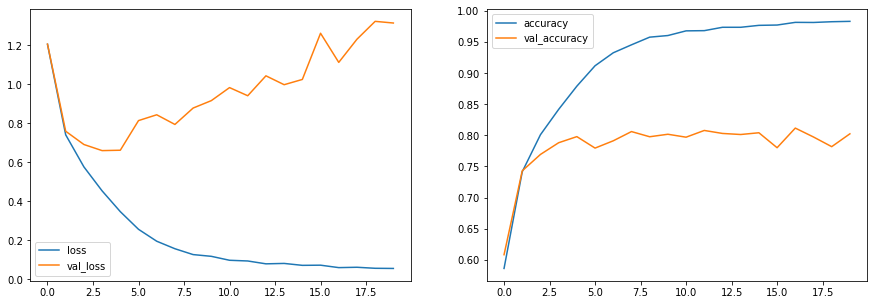

In [19]:
# Plot Learning Curves

import pandas as pd

fig, ax = plt.subplots(1,2, figsize=(15,5))

history_df = pd.DataFrame(new_mod.history)
history_df[['loss', 'val_loss']].plot(kind='line', ax=ax[0])
history_df[['accuracy', 'val_accuracy']].plot(kind='line', ax=ax[1])


### Generate Predictions

Original label is ship and predicted label is automobile


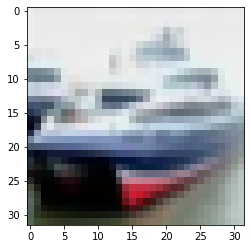

In [23]:
# Generate a Prediction

labels = '''airplane automobile bird cat deer dog frog horse ship truck'''.split()

# select the image from our test dataset
image_number = 1

# display the image
plt.imshow(x_test[image_number])

# load the image in an array
n = np.array(x_test[image_number])

# reshape the array 
p = n.reshape(1, 32, 32, 3)

# pass in the network for prediction and
# save the predicted label
predicted_label = labels[model.predict(p).argmax()]

# load the original label
original_label = labels[y_test[image_number]]

# display the result
print(f"Original label is {original_label} and predicted label is {predicted_label}")

Original label is frog and predicted label is frog


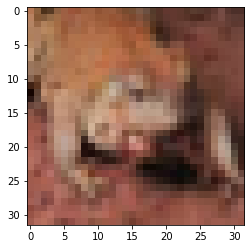

In [24]:
# Generate a Prediction

labels = '''airplane automobile bird cat deer dog frog horse ship truck'''.split()

# select the image from our test dataset
image_number = 5

# display the image
plt.imshow(x_test[image_number])

# load the image in an array
n = np.array(x_test[image_number])

# reshape the array 
p = n.reshape(1, 32, 32, 3)

# pass in the network for prediction and
# save the predicted label
predicted_label = labels[model.predict(p).argmax()]

# load the original label
original_label = labels[y_test[image_number]]

# display the result
print(f"Original label is {original_label} and predicted label is {predicted_label}")

Original label is airplane and predicted label is airplane


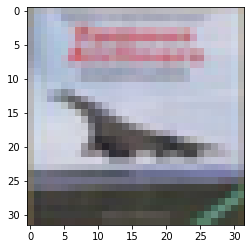

In [25]:
# Generate a Prediction

labels = '''airplane automobile bird cat deer dog frog horse ship truck'''.split()

# select the image from our test dataset
image_number = 3

# display the image
plt.imshow(x_test[image_number])

# load the image in an array
n = np.array(x_test[image_number])

# reshape the array 
p = n.reshape(1, 32, 32, 3)

# pass in the network for prediction and
# save the predicted label
predicted_label = labels[model.predict(p).argmax()]

# load the original label
original_label = labels[y_test[image_number]]

# display the result
print(f"Original label is {original_label} and predicted label is {predicted_label}")

Original label is horse and predicted label is horse


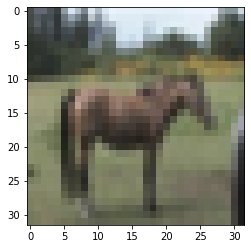

In [26]:
# Generate a Prediction

labels = '''airplane automobile bird cat deer dog frog horse ship truck'''.split()

# select the image from our test dataset
image_number = 9999

# display the image
plt.imshow(x_test[image_number])

# load the image in an array
n = np.array(x_test[image_number])

# reshape the array 
p = n.reshape(1, 32, 32, 3)

# pass in the network for prediction and
# save the predicted label
predicted_label = labels[model.predict(p).argmax()]

# load the original label
original_label = labels[y_test[image_number]]

# display the result
print(f"Original label is {original_label} and predicted label is {predicted_label}")

In [27]:
# 6.2b Build the model with dropout

K = len(set(y_train))

# calculate total number of classes
# for output layer
print("number of classes:", K)

# Build the model using the functional API
# input layer
i = Input(shape=x_train[0].shape)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(i)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

x = Flatten()(x)
x = Dropout(0.25)(x)

# Hidden layer
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)

# last hidden layer i.e.. output layer
x = Dense(K, activation='softmax')(x)

model = Model(i, x)

# model description
model.summary()

number of classes: 10
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 16, 16, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 8

In [28]:
# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [29]:
# 6.2b Fit with data augmentation

batch_size = 32
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(
width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)

train_generator = data_generator.flow(x_train, y_train, batch_size)
steps_per_epoch = x_train.shape[0] // batch_size

new_model = model.fit(train_generator, validation_data=(x_test, y_test),
                      steps_per_epoch=steps_per_epoch, epochs=20)


Epoch 1/20
1562/1562 [==============================] - 51s 33ms/step - loss: 1.5304 - accuracy: 0.4397 - val_loss: 1.0905 - val_accuracy: 0.6124
Epoch 2/20
1562/1562 [==============================] - 51s 33ms/step - loss: 1.1183 - accuracy: 0.6010 - val_loss: 1.0125 - val_accuracy: 0.6461
Epoch 3/20
1562/1562 [==============================] - 51s 33ms/step - loss: 0.9846 - accuracy: 0.6519 - val_loss: 0.8504 - val_accuracy: 0.7018
Epoch 4/20
1562/1562 [==============================] - 51s 33ms/step - loss: 0.9071 - accuracy: 0.6824 - val_loss: 0.7476 - val_accuracy: 0.7405
Epoch 5/20
1562/1562 [==============================] - 51s 33ms/step - loss: 0.8519 - accuracy: 0.7029 - val_loss: 0.7371 - val_accuracy: 0.7426
Epoch 6/20
1562/1562 [==============================] - 51s 33ms/step - loss: 0.8206 - accuracy: 0.7127 - val_loss: 0.6861 - val_accuracy: 0.7601
Epoch 7/20
1562/1562 [==============================] - 51s 33ms/step - loss: 0.7952 - accuracy: 0.7243 - val_loss: 0.7468 -

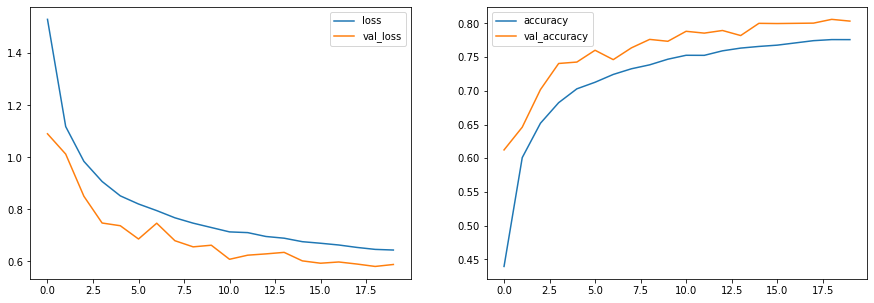

In [30]:
# Plot Learning Curves

fig, ax = plt.subplots(1,2, figsize=(15,5))

history_df = pd.DataFrame(new_model.history)
history_df[['loss', 'val_loss']].plot(kind='line', ax=ax[0])
history_df[['accuracy', 'val_accuracy']].plot(kind='line', ax=ax[1])


Original label is ship and predicted label is ship


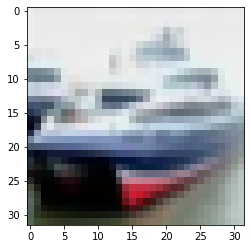

In [31]:
# Generate a Prediction

labels = '''airplane automobile bird cat deer dog frog horse ship truck'''.split()

# select the image from the test dataset
image_number = 1

# display the image
plt.imshow(x_test[image_number])

# load the image in an array
n = np.array(x_test[image_number])

# reshape the array 
p = n.reshape(1, 32, 32, 3)

# pass in the network for prediction and
# save the predicted label
predicted_label = labels[model.predict(p).argmax()]

# load the original label
original_label = labels[y_test[image_number]]

# display the result
print(f"Original label is {original_label} and predicted label is {predicted_label}")

Original label is horse and predicted label is horse


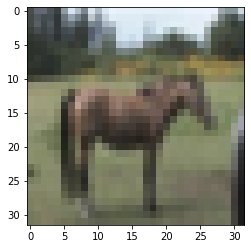

In [32]:
# Generate a Prediction

labels = '''airplane automobile bird cat deer dog frog horse ship truck'''.split()

# select the image from the test dataset
image_number = 9999

# display the image
plt.imshow(x_test[image_number])

# load the image in an array
n = np.array(x_test[image_number])

# reshape the array 
p = n.reshape(1, 32, 32, 3)

# pass in the network for prediction and
# save the predicted label
predicted_label = labels[model.predict(p).argmax()]

# load the original label
original_label = labels[y_test[image_number]]

# display the result
print(f"Original label is {original_label} and predicted label is {predicted_label}")


## Load the ResNet50 model

In [5]:
#6.3 ResNET50 model

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import numpy as np
import PIL

In [2]:
model = ResNet50(weights='imagenet')

img_path = 'precious_stryder.jpeg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', decode_predictions(preds, top=3)[0])


40960/35363 [==================================] - 0s 1us/step
Predicted: [('n02102318', 'cocker_spaniel', 0.58005065), ('n02086240', 'Shih-Tzu', 0.16435128), ('n02100735', 'English_setter', 0.06059162)]


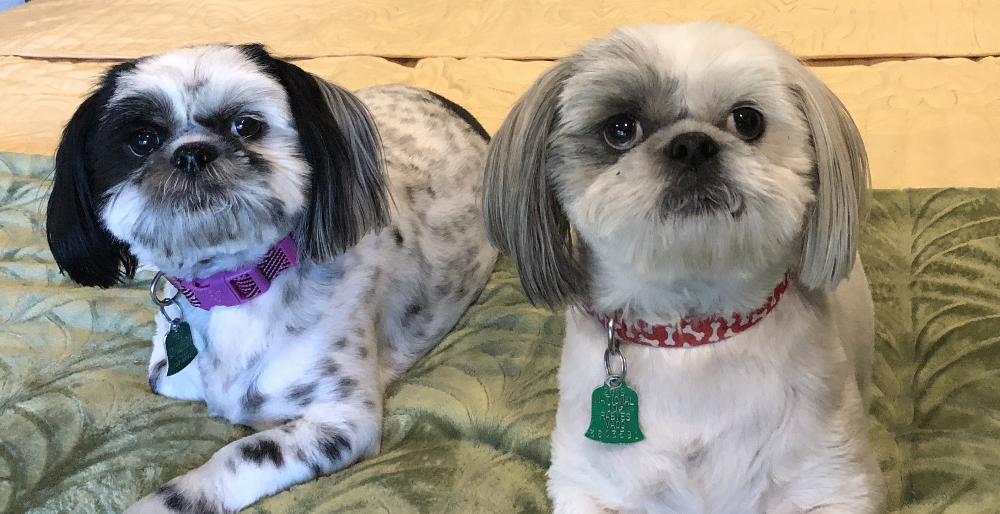

In [3]:
# Display my Shih Tzu fur babies
from IPython import display
display.Image("precious_stryder.jpeg")

In [6]:
model = ResNet50(weights='imagenet')

img_path = 'rosesv1.jpeg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', decode_predictions(preds, top=3)[0])


40960/35363 [==================================] - 0s 1us/step
Predicted: [('n03991062', 'pot', 0.87892425), ('n03930313', 'picket_fence', 0.040227942), ('n02797295', 'barrow', 0.01682531)]


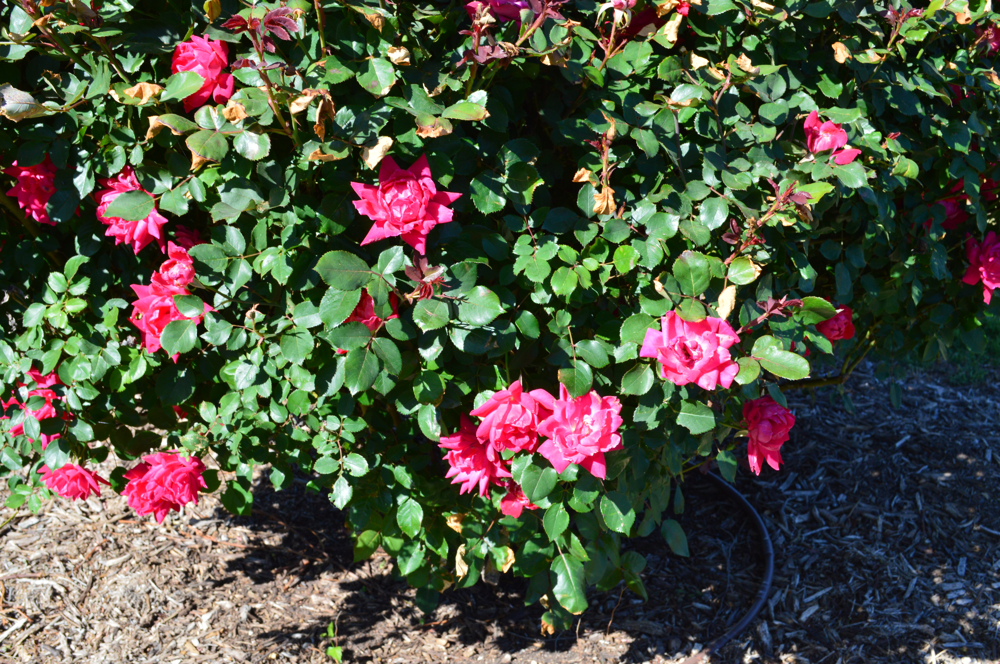

In [7]:
# Display rose bush
from IPython import display
display.Image("rosesv1.jpeg")

In [8]:
img_path = 'aidyn.jpeg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', decode_predictions(preds, top=3)[0])


Predicted: [('n04162706', 'seat_belt', 0.18271334), ('n03938244', 'pillow', 0.18187921), ('n02786058', 'Band_Aid', 0.14660415)]


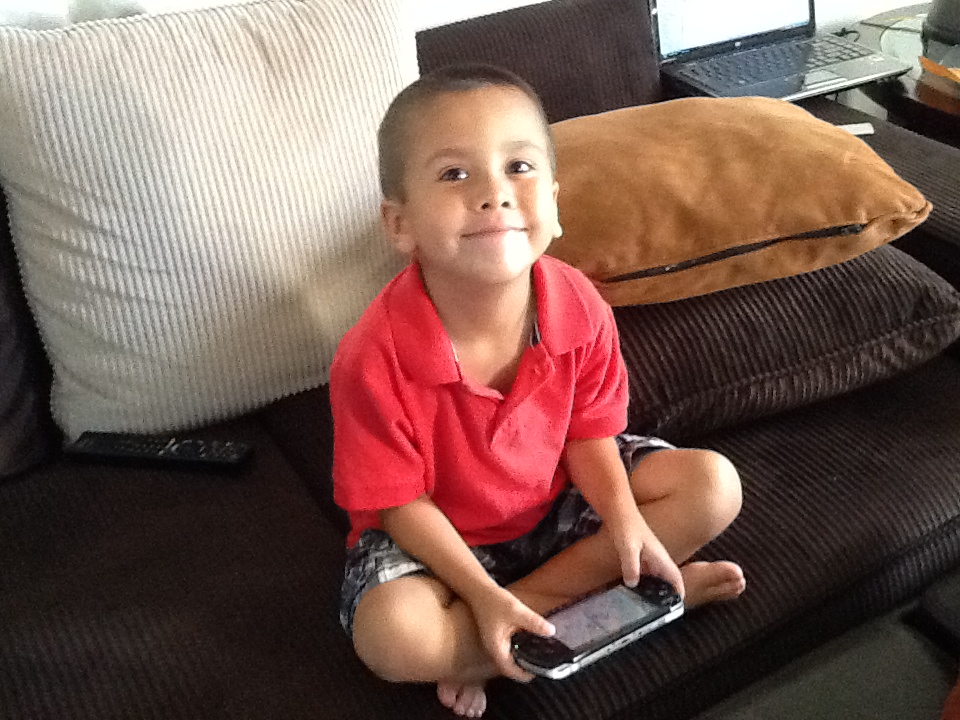

In [9]:
# Display my sweetie pie
from IPython import display
display.Image("aidyn.jpeg")